# Analysis of surface fields in SOGOS (Southern Ocean Glider Observations of the Submesoscale ) area

- variance at small scale
- surface spectra
- surface densities
- seasonal changes in above properties
- movies of surface fields


In [3]:
!pip install cmocean

  Using cached cmocean-2.0-py3-none-any.whl (223 kB)


In [4]:
# Load some useful modules 
import numpy as np
import xarray as xr
import xrft
from xmitgcm import llcreader
from matplotlib import pyplot as plt
import cmocean.cm as cm

In [77]:
import dask

In [5]:
from dask_gateway import GatewayCluster
from dask.distributed import Client
cluster = GatewayCluster()
cluster.scale(5)
client = Client(cluster)
cluster

In [6]:
%matplotlib inline

In [7]:
from intake import open_catalog

cat = open_catalog("https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean/llc4320.yaml")

In [8]:
# Get variables from catalog
sst = cat.LLC4320_SST.to_dask()
sss = cat.LLC4320_SSS.to_dask()
ssh = cat.LLC4320_SSH.to_dask()
u = cat.LLC4320_SSU.to_dask()
v = cat.LLC4320_SSV.to_dask()


In [9]:
coords = (cat.LLC4320_grid.to_dask()).sel(face=1)

In [10]:
ds = xr.merge([ssh.sel(face=1), sst.sel(face=1), sss.sel(face=1), 
               u.sel(face=1), v.sel(face=1)])
# select data using face

In [38]:
ds

<xarray.Dataset>
Dimensions:  (time: 9030, j: 4320, i: 4320, i_g: 4320, j_g: 4320, k: 90,
              k_l: 90, k_p1: 91, k_u: 90)
Coordinates:
    face     int64 1
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * k        (k) int64 0 1 2 3 4 5 6 7 8 9 10 ... 80 81 82 83 84 85 86 87 88 89
  * k_l      (k_l) int64 0 1 2 3 4 5 6 7 8 9 ... 80 81 82 83 84 85 86 87 88 89
  * k_p1     (k_p1) int64 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89 90
  * k_u      (k_u) int64 0 1 2 3 4 5 6 7 8 9 ... 80 81 82 83 84 85 86 87 88 89
Data variables:
    Eta      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SST      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SSS      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    iter     (time) int64 dask.array<chunksize=(9030,), meta=np.ndarray>
    U        (time, j, i_g) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    V        (time, j_g, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SSD      (time, j, i) float64 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Spice    (time, j, i) float64 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      Created by calling `open_mdsdataset(llc_method='smallchunks...
    source:       MITgcm
    title:        netCDF wrapper of MITgcm MDS binary data

In [11]:
import xgcm
grid = xgcm.Grid(coords.drop(['k', 'k_p1']), periodic=None)

In [40]:
grid

<xgcm.Grid>
Y Axis (not periodic, boundary=None):
  * center   j --> left
  * left     j_g --> center
T Axis (not periodic, boundary=None):
  * center   time
X Axis (not periodic, boundary=None):
  * center   i --> left
  * left     i_g --> center

In [12]:
from fastjmd95 import rho
ds['SSD'] = xr.apply_ufunc(rho, 
                        ds.SSS, ds.SST, 0, 
                        dask='parallelized', output_dtypes=[float,]).rename('SSD')

In [41]:
rho

<function fastjmd95.jmd95wrapper.maybe_wrap_arrays.<locals>.wrapper(*args)>

In [46]:
import gsw
ds['Spice'] = xr.apply_ufunc(gsw.spiciness0, 
                        ds.SSS, ds.SST,  
                        dask='parallelized', output_dtypes=[float,]).rename('Spice')

In [47]:
gsw.spiciness0

<function gsw._wrapped_ufuncs.spiciness0(SA, CT)>

In [48]:
ds

<xarray.Dataset>
Dimensions:  (time: 9030, j: 4320, i: 4320, i_g: 4320, j_g: 4320, k: 90,
              k_l: 90, k_p1: 91, k_u: 90)
Coordinates:
    face     int64 1
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * k        (k) int64 0 1 2 3 4 5 6 7 8 9 10 ... 80 81 82 83 84 85 86 87 88 89
  * k_l      (k_l) int64 0 1 2 3 4 5 6 7 8 9 ... 80 81 82 83 84 85 86 87 88 89
  * k_p1     (k_p1) int64 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89 90
  * k_u      (k_u) int64 0 1 2 3 4 5 6 7 8 9 ... 80 81 82 83 84 85 86 87 88 89
Data variables:
    Eta      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SST      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SSS      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    iter     (time) int64 dask.array<chunksize=(9030,), meta=np.ndarray>
    U        (time, j, i_g) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    V        (time, j_g, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SSD      (time, j, i) float64 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Spice    (time, j, i) float64 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      Created by calling `open_mdsdataset(llc_method='smallchunks...
    source:       MITgcm
    title:        netCDF wrapper of MITgcm MDS binary data

In [49]:
glid659 = xr.load_dataset('./glider-panel-demo/data/659_locs.nc')
glid660 = xr.load_dataset('./glider-panel-demo/data/660_locs.nc')

In [50]:
glid659

<xarray.Dataset>
Dimensions:    (dives: 923)
Coordinates:
  * dives      (dives) float64 1.0 1.5 2.0 2.5 3.0 ... 461.0 461.5 462.0 462.5
Data variables:
    longitude  (dives) float64 30.03 30.04 30.05 30.06 ... 38.95 38.97 38.99
    latitude   (dives) float64 -51.5 -51.5 -51.49 -51.49 ... -51.72 -51.71 -51.7
    days       (dives) float64 119.6 119.6 119.6 119.6 ... 205.8 205.9 206.0
    distance   (dives) float64 0.2874 0.8218 1.976 ... 1.487e+03 1.488e+03

## Calc quantities with gradients

In [52]:
ds

<xarray.Dataset>
Dimensions:  (time: 9030, j: 4320, i: 4320, i_g: 4320, j_g: 4320, k: 90,
              k_l: 90, k_p1: 91, k_u: 90)
Coordinates:
    face     int64 1
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * k        (k) int64 0 1 2 3 4 5 6 7 8 9 10 ... 80 81 82 83 84 85 86 87 88 89
  * k_l      (k_l) int64 0 1 2 3 4 5 6 7 8 9 ... 80 81 82 83 84 85 86 87 88 89
  * k_p1     (k_p1) int64 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89 90
  * k_u      (k_u) int64 0 1 2 3 4 5 6 7 8 9 ... 80 81 82 83 84 85 86 87 88 89
Data variables:
    Eta      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SST      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SSS      (time, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    iter     (time) int64 dask.array<chunksize=(9030,), meta=np.ndarray>
    U        (time, j, i_g) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    V        (time, j_g, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SSD      (time, j, i) float64 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Spice    (time, j, i) float64 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      Created by calling `open_mdsdataset(llc_method='smallchunks...
    source:       MITgcm
    title:        netCDF wrapper of MITgcm MDS binary data

In [53]:
coords.dyG

<xarray.DataArray 'dyG' (j: 4320, i_g: 4320)>
dask.array<getitem, shape=(4320, 4320), dtype=float32, chunksize=(4320, 4320), chunktype=numpy.ndarray>
Coordinates: (12/15)
    PHrefC   float32 ...
    Z        float32 ...
    Zl       float32 ...
    Zu       float32 ...
    drF      float32 ...
    dxC      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    ...       ...
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    k        int64 ...
    k_l      int64 ...
    k_u      int64 ...
    rAw      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
Attributes:
    coordinate:     YC XG
    long_name:      cell y size
    standard_name:  cell_y_size_at_u_location
    units:          m

In [14]:
u_transport = ds.U * coords.dyG 
v_transport = ds.V * coords.dxG 

In [51]:
u_transport

<xarray.DataArray (time: 9030, j: 4320, i_g: 4320)>
dask.array<mul, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates: (12/16)
    face     int64 1
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    PHrefC   float32 ...
    Z        float32 ...
    ...       ...
    dyG      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    hFacW    (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    k        int64 ...
    k_l      int64 ...
    k_u      int64 ...
    rAw      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>

In [54]:
u_transport.isel(time=0)

<xarray.DataArray (j: 4320, i_g: 4320)>
dask.array<getitem, shape=(4320, 4320), dtype=float32, chunksize=(4320, 4320), chunktype=numpy.ndarray>
Coordinates: (12/16)
    face     int64 1
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    time     datetime64[ns] 2011-09-13
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    PHrefC   float32 ...
    Z        float32 ...
    ...       ...
    dyG      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    hFacW    (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    k        int64 ...
    k_l      int64 ...
    k_u      int64 ...
    rAw      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>

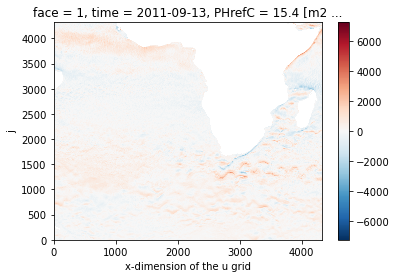

In [55]:
u_transport.isel(time=0).plot() #This is face 1 area

In [15]:
div_uv = (grid.diff(u_transport, 'X', boundary='extend') + grid.diff(v_transport, 'Y', boundary='extend')) / coords.rA # 散度 divergence

In [56]:
div_uv

<xarray.DataArray (time: 9030, j: 4320, i: 4320)>
dask.array<truediv, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates: (12/19)
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
    CS       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    PHrefC   float32 ...
    ...       ...
    face     int64 1
    hFacC    (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    k        int64 ...
    k_l      int64 ...
    k_u      int64 ...
    rA       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>

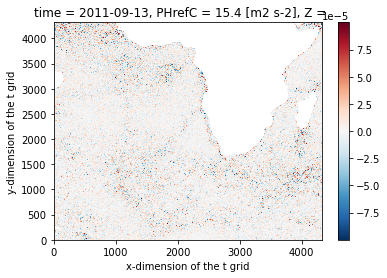

In [62]:
div_uv.isel(time=0).where((div_uv.isel(time=0) < 0.0001) & (div_uv.isel(time=0) >-0.0001)).plot()

In [16]:
zeta = (-grid.diff(ds.U * coords.dxC, 'Y', boundary='extend') + grid.diff(ds.V * coords.dyC, 'X', boundary='extend'))/coords.rAz # 旋度 vorticity

In [63]:
zeta

<xarray.DataArray (time: 9030, j_g: 4320, i_g: 4320)>
dask.array<truediv, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates: (12/15)
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
    PHrefC   float32 ...
    XG       (j_g, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YG       (j_g, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    ...       ...
    drF      float32 ...
    face     int64 1
    k        int64 ...
    k_l      int64 ...
    k_u      int64 ...
    rAz      (j_g, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>

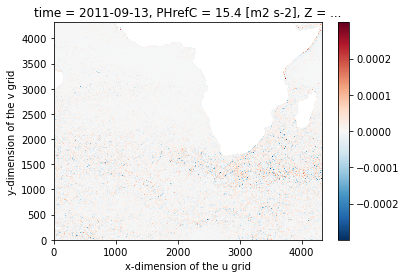

In [64]:
zeta.isel(time=0).where((zeta.isel(time=0) < 0.0003) & (zeta.isel(time=0) >-0.0003)).plot()

In [17]:
strain1 = (grid.diff(ds.U * coords.dyG, 'X', boundary='extend') - grid.diff(ds.V * coords.dxG, 'Y',boundary='extend')) / coords.rA
strain2 = (grid.diff(ds.U * coords.dxC, 'Y', boundary='extend') + grid.diff(ds.V * coords.dyC, 'X', boundary='extend'))/coords.rAz
strain2 = grid.interp(grid.interp(strain2, 'X', boundary='extend'), 'Y', boundary='extend')

In [65]:
strain2

<xarray.DataArray (time: 9030, j: 4320, i: 4320)>
dask.array<transpose, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00

In [18]:
strain = (strain1**2 + strain2**2)**0.5

In [66]:
strain

<xarray.DataArray (time: 9030, j: 4320, i: 4320)>
dask.array<pow, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates: (12/19)
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
    CS       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    PHrefC   float32 ...
    ...       ...
    face     int64 1
    hFacC    (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    k        int64 ...
    k_l      int64 ...
    k_u      int64 ...
    rA       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>

In [19]:
gradT = (grid.interp(grid.diff(ds.SST,'X',boundary='extend')/coords.dxC, 'X', boundary='extend')**2 +
         grid.interp(grid.diff(ds.SST,'Y',boundary='extend')/coords.dyC, 'Y', boundary='extend')**2)**0.5 # 梯度 gradient

In [67]:
gradT

<xarray.DataArray (time: 9030, j: 4320, i: 4320)>
dask.array<pow, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00

In [20]:
gradS = (grid.interp(grid.diff(ds.SSS,'X',boundary='extend')/coords.dxC, 'X', boundary='extend')**2 +
         grid.interp(grid.diff(ds.SSS,'Y',boundary='extend')/coords.dyC, 'Y', boundary='extend')**2)**0.5

gradD = (grid.interp(grid.diff(ds.SSD,'X',boundary='extend')/coords.dxC, 'X', boundary='extend')**2 +
         grid.interp(grid.diff(ds.SSD,'Y',boundary='extend')/coords.dyC, 'Y', boundary='extend')**2)**0.5

In [21]:
KE = 0.5*(grid.interp(ds.U,'X',boundary='extend')**2 + grid.interp(ds.V,'Y',boundary='extend')**2) # 动能 

In [68]:
KE

<xarray.DataArray (time: 9030, j: 4320, i: 4320)>
dask.array<mul, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00

In [22]:
U = grid.interp(ds.U,'X',boundary='extend')
V = grid.interp(ds.V,'Y',boundary='extend')

In [69]:
U

<xarray.DataArray 'U' (time: 9030, j: 4320, i: 4320)>
dask.array<transpose, shape=(9030, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00

### Select Area

SOGOS area   
Lat ~ -55 -> -48  
Lon ~ 28 -> 40

In [23]:
sel_XC = np.logical_and(coords.XC>25, coords.XC<40 ) 
sel_XG = np.logical_and(coords.XG>25, coords.XG<40 )
sel_YC = np.logical_and(coords.YC>-60, coords.YC<-45 )
sel_YG = np.logical_and(coords.YG>-60, coords.YG<-45 )

In [70]:
sel_XC

<xarray.DataArray 'XC' (j: 4320, i: 4320)>
dask.array<logical_and, shape=(4320, 4320), dtype=bool, chunksize=(4320, 4320), chunktype=numpy.ndarray>
Coordinates: (12/18)
    CS       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    PHrefC   float32 15.4
    SN       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    ...       ...
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rA       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>

In [24]:
XC = coords.XC.where(sel_XC & sel_YC, drop=True)
YC = coords.YC.where(sel_XC & sel_YC, drop=True)
XCmean = XC.mean(['j'])
YCmean = YC.mean(['i'])

Xmax = XC.max(['j'])
Xmin = XC.min(['j'])
Ymax = YC.max(['i'])
Ymin = YC.min(['i'])

In [71]:
XC

<xarray.DataArray 'XC' (j: 974, i: 720)>
dask.array<where, shape=(974, 720), dtype=float32, chunksize=(974, 720), chunktype=numpy.ndarray>
Coordinates: (12/18)
    CS       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    PHrefC   float32 15.4
    SN       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    ...       ...
  * i        (i) int64 3024 3025 3026 3027 3028 ... 3739 3740 3741 3742 3743
  * j        (j) int64 0 1 2 3 4 5 6 7 8 ... 965 966 967 968 969 970 971 972 973
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rA       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
Attributes:
    coordinate:     YC XC
    long_name:      longitude
    standard_name:  longitude
    units:          degrees_east

In [25]:
XG = coords.XG.where(sel_XG & sel_YG, drop=True)
YG = coords.YG.where(sel_XG & sel_YG, drop=True)
XGmean = XG.mean(['j_g'])
YGmean = YG.mean(['i_g'])

In [72]:
XG

<xarray.DataArray 'XG' (j_g: 974, i_g: 719)>
dask.array<where, shape=(974, 719), dtype=float32, chunksize=(974, 719), chunktype=numpy.ndarray>
Coordinates: (12/14)
    PHrefC   float32 15.4
    XG       (j_g, i_g) float32 dask.array<chunksize=(974, 719), meta=np.ndarray>
    YG       (j_g, i_g) float32 dask.array<chunksize=(974, 719), meta=np.ndarray>
    Z        float32 -1.57
    Zl       float32 -1.0
    Zu       float32 -2.14
    ...       ...
  * i_g      (i_g) int64 3025 3026 3027 3028 3029 ... 3739 3740 3741 3742 3743
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 ... 966 967 968 969 970 971 972 973
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rAz      (j_g, i_g) float32 dask.array<chunksize=(974, 719), meta=np.ndarray>
Attributes:
    coordinate:     YG XG
    long_name:      longitude
    standard_name:  longitude_at_f_location
    units:          degrees_east

In [73]:
XGmean

<xarray.DataArray 'XG' (i_g: 719)>
dask.array<mean_agg-aggregate, shape=(719,), dtype=float32, chunksize=(719,), chunktype=numpy.ndarray>
Coordinates:
    PHrefC   float32 15.4
    Z        float32 -1.57
    Zl       float32 -1.0
    Zu       float32 -2.14
    drF      float32 1.14
    face     int64 1
  * i_g      (i_g) int64 3025 3026 3027 3028 3029 ... 3739 3740 3741 3742 3743
    k        int64 1
    k_l      int64 1
    k_u      int64 1

In [78]:
dask.config.set(**{'array.slicing.split_large_chunks': False}) # To accept the large chunk and silence this warning, set the option

In [79]:
SSH_sogos = ds.Eta.where(sel_XC & sel_YC, drop=True)
SST_sogos = ds.SST.where(sel_XC & sel_YC, drop=True)
SSS_sogos = ds.SSS.where(sel_XC & sel_YC, drop=True)
SSD_sogos = ds.SSD.where(sel_XC & sel_YC, drop=True)

In [80]:
Spice_sogos = ds.Spice.where(sel_XC & sel_YC, drop=True)

In [81]:
Spice_sogos

<xarray.DataArray 'Spice' (time: 9030, j: 974, i: 720)>
dask.array<where, shape=(9030, 974, 720), dtype=float64, chunksize=(1, 974, 720), chunktype=numpy.ndarray>
Coordinates: (12/19)
    face     int64 1
  * i        (i) int64 3024 3025 3026 3027 3028 ... 3739 3740 3741 3742 3743
  * j        (j) int64 0 1 2 3 4 5 6 7 8 ... 965 966 967 968 969 970 971 972 973
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
    CS       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    ...       ...
    drF      float32 1.14
    hFacC    (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rA       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>

In [82]:
zeta_sogos = zeta.where(sel_XG & sel_YG, drop=True)
div_sogos  = div_uv.where(sel_XC & sel_YC, drop=True)
strain_sogos = strain.where(sel_XC & sel_YC, drop=True)

In [83]:
gradD_sogos = gradD.where(sel_XC & sel_YC, drop=True)
gradT_sogos = gradT.where(sel_XC & sel_YC, drop=True)
gradS_sogos = gradS.where(sel_XC & sel_YC, drop=True)

In [84]:
KE_sogos = KE.where(sel_XC & sel_YC, drop=True)

In [85]:
U_sogos = U.where(sel_XC & sel_YC, drop=True)
V_sogos = V.where(sel_XC & sel_YC, drop=True)

In [86]:
U_sogos

<xarray.DataArray 'U' (time: 9030, j: 974, i: 720)>
dask.array<where, shape=(9030, 974, 720), dtype=float32, chunksize=(1, 974, 720), chunktype=numpy.ndarray>
Coordinates: (12/19)
  * i        (i) int64 3024 3025 3026 3027 3028 ... 3739 3740 3741 3742 3743
  * j        (j) int64 0 1 2 3 4 5 6 7 8 ... 965 966 967 968 969 970 971 972 973
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
    CS       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    PHrefC   float32 15.4
    ...       ...
    face     int64 1
    hFacC    (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rA       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>

### Seasonal Evolution of temperature, salinity, and height

In [87]:
slice(0,-1,40)

slice(0, -1, 40)

In [89]:
SST_sogos.isel(i=slice(0,-1,40), j=slice(0,-1,40), time=slice(0,-1,24*5)) # -1 mean the last one

<xarray.DataArray 'SST' (time: 76, j: 25, i: 18)>
dask.array<getitem, shape=(76, 25, 18), dtype=float32, chunksize=(1, 25, 18), chunktype=numpy.ndarray>
Coordinates: (12/19)
    face     int64 1
  * i        (i) int64 3024 3064 3104 3144 3184 ... 3544 3584 3624 3664 3704
  * j        (j) int64 0 40 80 120 160 200 240 ... 720 760 800 840 880 920 960
  * time     (time) datetime64[ns] 2011-09-13 2011-09-18 ... 2012-09-22
    CS       (j, i) float32 dask.array<chunksize=(25, 18), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(25, 18), meta=np.ndarray>
    ...       ...
    drF      float32 1.14
    hFacC    (j, i) float32 dask.array<chunksize=(25, 18), meta=np.ndarray>
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rA       (j, i) float32 dask.array<chunksize=(25, 18), meta=np.ndarray>

In [90]:
SST_sogos

<xarray.DataArray 'SST' (time: 9030, j: 974, i: 720)>
dask.array<where, shape=(9030, 974, 720), dtype=float32, chunksize=(1, 974, 720), chunktype=numpy.ndarray>
Coordinates: (12/19)
    face     int64 1
  * i        (i) int64 3024 3025 3026 3027 3028 ... 3739 3740 3741 3742 3743
  * j        (j) int64 0 1 2 3 4 5 6 7 8 ... 965 966 967 968 969 970 971 972 973
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
    CS       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    ...       ...
    drF      float32 1.14
    hFacC    (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rA       (j, i) float32 dask.array<chunksize=(974, 720), meta=np.ndarray>

In [33]:
SST_monthly= SST_sogos.isel(i=slice(0,-1,40), j=slice(0,-1,40), time=slice(0,-1,24*5)).groupby("time.month").mean(['time','i','j'])
SSD_monthly= SSD_sogos.isel(i=slice(0,-1,40), j=slice(0,-1,40), time=slice(0,-1,24*5)).groupby("time.month").mean(['time','i','j'])
SSS_monthly= SSS_sogos.isel(i=slice(0,-1,40), j=slice(0,-1,40), time=slice(0,-1,24*5)).groupby("time.month").mean(['time','i','j'])
Spice_monthly = Spice_sogos.isel(i=slice(0,-1,40), j=slice(0,-1,40), time=slice(0,-1,24*5)).groupby("time.month").mean(['time','i','j'])

In [91]:
Spice_monthly

<xarray.DataArray 'Spice' (month: 12)>
array([-0.42987478, -0.38748504, -0.3995565 , -0.42297272, -0.48245837,
       -0.53282098, -0.5514602 , -0.53730517, -0.56477895, -0.58654127,
       -0.55855036, -0.49423932])
Coordinates:
    face     int64 1
    PHrefC   float32 15.4
    Z        float32 -1.57
    Zl       float32 -1.0
    Zu       float32 -2.14
    drF      float32 1.14
    k        int64 1
    k_l      int64 1
    k_u      int64 1
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [36]:
SST_monthly.load();
SSS_monthly.load();
SSD_monthly.load();
Spice_monthly.load();

In [92]:
SST_monthly

<xarray.DataArray 'SST' (month: 12)>
array([4.3454986, 4.7679625, 4.701868 , 4.344746 , 3.742035 , 3.1587138,
       2.730377 , 2.5883765, 2.3968475, 2.4747703, 2.8691664, 3.6746905],
      dtype=float32)
Coordinates:
    face     int64 1
    PHrefC   float32 15.4
    Z        float32 -1.57
    Zl       float32 -1.0
    Zu       float32 -2.14
    drF      float32 1.14
    k        int64 1
    k_l      int64 1
    k_u      int64 1
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [93]:
from mpl_toolkits.axisartist.parasite_axes import HostAxes, ParasiteAxes

In [94]:
SST_monthly.month.values

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

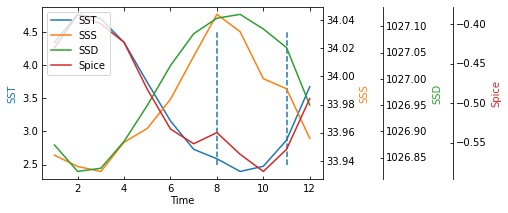

In [95]:
fig = plt.figure(figsize=(6,3))

host = HostAxes(fig, [0.15, 0.1, 0.65, 0.8])
par1 = ParasiteAxes(host, sharex=host)
par2 = ParasiteAxes(host, sharex=host)
par3 = ParasiteAxes(host, sharex=host)
host.parasites.append(par1)
host.parasites.append(par2)
host.parasites.append(par3)

host.set_ylabel("SST")
host.set_xlabel("Time")
host.axis["right"].set_visible(False)

par1.axis["right"].set_visible(True)
par1.set_ylabel("SSS")

par1.axis["right"].major_ticklabels.set_visible(True)
par1.axis["right"].label.set_visible(True)

par2.set_ylabel("SSD")
offset = (60, 0)
new_axisline = par2.get_grid_helper().new_fixed_axis
par2.axis["right2"] = new_axisline(loc="right", axes=par2, offset=offset)

par3.set_ylabel("Spice")
offset = (130, 0)
new_axisline = par3.get_grid_helper().new_fixed_axis
par3.axis["right3"] = new_axisline(loc="right", axes=par3, offset=offset)


fig.add_axes(host)

#host.set_xlim(0, 2)
#host.set_ylim(0, 2)

#host.set_xlabel("Distance")
#host.set_ylabel("Density")
#par1.set_ylabel("Temperature")

p1, = host.plot(SST_monthly.month, SST_monthly, label="SST")
host.vlines((SST_monthly.month[7].values,SST_monthly.month[10].values), 2.5,4.5, linestyles='dashed')

p2, = par1.plot(SSS_monthly.month, SSS_monthly, label="SSS")
p3, = par2.plot(SSD_monthly.month, SSD_monthly, label="SSD")
p4, = par3.plot(Spice_monthly.month, Spice_monthly, label="Spice")

#par1.set_ylim(0, 4)
#par2.set_ylim(1, 65)

host.legend(loc=2)

host.axis["left"].label.set_color(p1.get_color())
par1.axis["right"].label.set_color(p2.get_color())
par2.axis["right2"].label.set_color(p3.get_color())
par3.axis["right3"].label.set_color(p4.get_color())

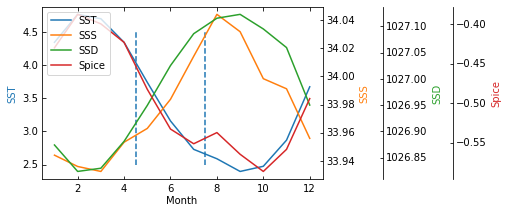

In [96]:
fig = plt.figure(figsize=(6,3))

host = HostAxes(fig, [0.15, 0.1, 0.65, 0.8])
par1 = ParasiteAxes(host, sharex=host)
par2 = ParasiteAxes(host, sharex=host)
par3 = ParasiteAxes(host, sharex=host)
host.parasites.append(par1)
host.parasites.append(par2)
host.parasites.append(par3)

host.set_ylabel("SST")
host.set_xlabel("Month")
host.axis["right"].set_visible(False)

par1.axis["right"].set_visible(True)
par1.set_ylabel("SSS")

par1.axis["right"].major_ticklabels.set_visible(True)
par1.axis["right"].label.set_visible(True)

par2.set_ylabel("SSD")
offset = (60, 0)
new_axisline = par2.get_grid_helper().new_fixed_axis
par2.axis["right2"] = new_axisline(loc="right", axes=par2, offset=offset)

par3.set_ylabel("Spice")
offset = (130, 0)
new_axisline = par3.get_grid_helper().new_fixed_axis
par3.axis["right3"] = new_axisline(loc="right", axes=par3, offset=offset)


fig.add_axes(host)

#host.set_xlim(0, 2)
#host.set_ylim(0, 2)

#host.set_xlabel("Distance")
#host.set_ylabel("Density")
#par1.set_ylabel("Temperature")

p1, = host.plot(SST_monthly.month, SST_monthly, label="SST")
host.vlines((4.5,7.5), 2.5,4.5, linestyles='dashed')

p2, = par1.plot(SSS_monthly.month, SSS_monthly, label="SSS")
p3, = par2.plot(SSD_monthly.month, SSD_monthly, label="SSD")
p4, = par3.plot(Spice_monthly.month, Spice_monthly, label="Spice")

#par1.set_ylim(0, 4)
#par2.set_ylim(1, 65)

host.legend(loc=2)

host.axis["left"].label.set_color(p1.get_color())
par1.axis["right"].label.set_color(p2.get_color())
par2.axis["right2"].label.set_color(p3.get_color())
par3.axis["right3"].label.set_color(p4.get_color())

### Seasonal Evolution of Gradient Quantities

In [97]:
# f=2*omega*sin(theta)
f = 2*(2*np.pi/24/3600)*np.sin(-55*np.pi/360)

In [98]:
strain_var = strain_sogos.isel(i=slice(0,-1,1), j=slice(0,-1,1), 
                               time=slice(0,-1,24*5)).var(['i','j'])

In [99]:
strain_var.load()

<xarray.DataArray (time: 76)>
array([2.9392716e-10, 3.9027379e-10, 2.8386182e-10, 2.6824654e-10,
       3.7340550e-10, 2.5138894e-10, 2.6190633e-10, 2.9275349e-10,
       3.1570899e-10, 3.1213476e-10, 2.3429858e-10, 2.4424812e-10,
       2.9191657e-10, 2.3165005e-10, 2.2393939e-10, 2.2186726e-10,
       2.3483135e-10, 2.9674704e-10, 2.6937244e-10, 2.6272221e-10,
       2.3923619e-10, 2.4958891e-10, 2.8822236e-10, 2.5465913e-10,
       2.0537501e-10, 2.7726088e-10, 2.7249042e-10, 2.9861133e-10,
       3.0537869e-10, 2.2410303e-10, 3.2454345e-10, 2.6466321e-10,
       2.3569857e-10, 2.6680819e-10, 2.5598718e-10, 2.0223626e-10,
       2.4879029e-10, 2.6925798e-10, 2.3640773e-10, 2.7312919e-10,
       2.4644545e-10, 2.0158722e-10, 2.9420064e-10, 2.2365136e-10,
       1.9323808e-10, 2.8635924e-10, 3.1659025e-10, 2.6874439e-10,
       3.1133945e-10, 2.4489871e-10, 3.0198241e-10, 3.0443084e-10,
       2.5832655e-10, 2.3817212e-10, 2.8315691e-10, 2.8512240e-10,
       3.5249331e-10, 3.8935435e-10, 3.8572937e-10, 3.7739503e-10,
       3.5695746e-10, 3.0582495e-10, 3.3021000e-10, 4.2388776e-10,
       3.3613762e-10, 3.4266431e-10, 3.6725939e-10, 3.7167611e-10,
       3.6532680e-10, 3.8713602e-10, 3.7319992e-10, 3.7539635e-10,
       4.7087950e-10, 3.9514939e-10, 4.8971172e-10, 3.6397210e-10],
      dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2011-09-13 2011-09-18 ... 2012-09-22
    PHrefC   float32 15.4
    Z        float32 -1.57
    Zl       float32 -1.0
    Zu       float32 -2.14
    drF      float32 1.14
    face     int64 1
    k        int64 1
    k_l      int64 1
    k_u      int64 1

In [100]:
zeta_var = zeta_sogos.isel(i_g=slice(0,-1,1), j_g=slice(0,-1,1), 
                               time=slice(0,-1,24*5)).var(['i_g','j_g'])
zeta_var.load()

<xarray.DataArray (time: 76)>
array([6.8110606e-10, 1.0237251e-09, 7.2880157e-10, 6.7640965e-10,
       1.0021864e-09, 6.5770867e-10, 6.6978417e-10, 7.6138856e-10,
       8.3595553e-10, 8.7392715e-10, 6.0796868e-10, 6.5375039e-10,
       7.5345014e-10, 5.7768662e-10, 5.7920696e-10, 5.3977589e-10,
       5.3842425e-10, 7.2414452e-10, 6.0550925e-10, 5.5557942e-10,
       5.3380933e-10, 5.2339227e-10, 5.7663024e-10, 5.6238197e-10,
       4.4275036e-10, 5.6325650e-10, 5.8854915e-10, 6.0037780e-10,
       5.8700056e-10, 5.1193416e-10, 6.9436218e-10, 5.2459759e-10,
       5.4449606e-10, 5.6138466e-10, 5.5094063e-10, 4.7101162e-10,
       5.1314958e-10, 5.7704919e-10, 5.7465410e-10, 6.0653460e-10,
       5.6977140e-10, 5.0713178e-10, 6.5990491e-10, 5.6419364e-10,
       4.7609949e-10, 6.8139644e-10, 7.7687812e-10, 6.7731643e-10,
       8.0377538e-10, 6.1254180e-10, 7.8676088e-10, 7.5985018e-10,
       6.7858358e-10, 6.3129330e-10, 7.3673084e-10, 7.2199130e-10,
       8.2656043e-10, 9.4850361e-10, 1.0771252e-09, 1.0046366e-09,
       9.0316427e-10, 7.7195750e-10, 8.3743823e-10, 1.1013347e-09,
       8.9836671e-10, 8.9252494e-10, 9.6059649e-10, 9.8482256e-10,
       9.0524604e-10, 9.6166630e-10, 9.7035335e-10, 9.7862618e-10,
       1.2190091e-09, 9.4201258e-10, 1.1780326e-09, 9.2356051e-10],
      dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2011-09-13 2011-09-18 ... 2012-09-22
    PHrefC   float32 15.4
    Z        float32 -1.57
    Zl       float32 -1.0
    Zu       float32 -2.14
    drF      float32 1.14
    face     int64 1
    k        int64 1
    k_l      int64 1
    k_u      int64 1

In [101]:
gradD_var = gradD_sogos.isel(i=slice(0,-1,1), j=slice(0,-1,1), 
                               time=slice(0,-1,24*5)).var(['i','j'])
gradD_var.load();

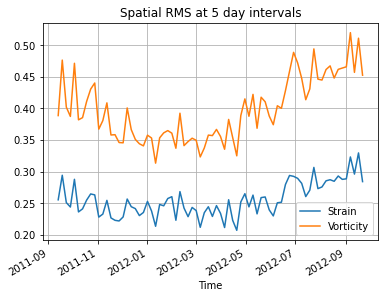

In [102]:
(strain_var**0.5/(-f)).plot(label='Strain')
(zeta_var**0.5/(-f)).plot(label='Vorticity')
#(div_var**0.5/(-f)).plot(label='Divergence')
plt.legend()
plt.title('Spatial RMS at 5 day intervals')
plt.grid()

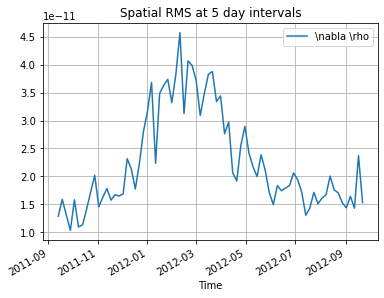

In [103]:
gradD_var.plot(label=r'\nabla \rho')
#(div_var**0.5/(-f)).plot(label='Divergence')
plt.legend()
plt.title('Spatial RMS at 5 day intervals')
plt.grid()

In [104]:
div_var = div_sogos.isel(i=slice(0,-1,10), j=slice(0,-1,10), 
                               time=slice(0,-1,24*5)).var(['i','j'])

In [105]:

div_var.load();

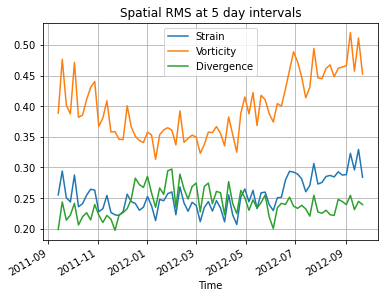

In [106]:
(strain_var**0.5/(-f)).plot(label='Strain')
(zeta_var**0.5/(-f)).plot(label='Vorticity')
(div_var**0.5/(-f)).plot(label='Divergence')
plt.legend()
plt.title('Spatial RMS at 5 day intervals')
plt.grid()

In [107]:
strain_var_time = strain_sogos.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                               time=slice(0,-1,5*24)).var(['time'])

In [108]:
strain_var_time.load();

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [109]:
SV_coarse = strain_var_time.coarsen(i=5, j=5, boundary='trim').mean();
XC_coarse = XC.isel(i=slice(0,-1,5), j=slice(0,-1,5)).coarsen(i=5, j=5, boundary='trim').mean()
YC_coarse = YC.isel(i=slice(0,-1,5), j=slice(0,-1,5)).coarsen(i=5, j=5, boundary='trim').mean()

Text(0.5, 1.0, 'Strain Variance')

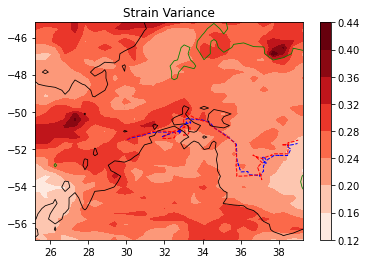

In [150]:
plt.contourf(XC_coarse, YC_coarse, 
               SV_coarse**0.5/(-f), cmap='Reds', vmax=0.4 )
plt.colorbar()

plt.plot(glid659.longitude, glid659.latitude, '--', linewidth=1, color='b')
plt.plot(glid660.longitude, glid660.latitude, '--', linewidth=1, color='r')

plt.contour(XC_coarse, YC_coarse, 
               SV_coarse.Depth, levels=[3000,  5000], linewidths=0.8,
           colors=['g','k'])

plt.title('Strain Variance')

## Histograms of gradient quantities

In [111]:
bins = np.linspace(-2, 4, 20)

In [112]:
zeta_sogos_3day = zeta_sogos.isel(time=slice(0,-1,24*3))

In [113]:
vort_hist_SON = np.histogram(zeta_sogos_3day.isel(i_g=slice(0,-1,5), j_g=slice(0,-1,5), 
                            time=zeta_sogos_3day.groupby("time.season").groups['SON'])/f, bins=bins);

In [114]:
vort_hist_DJF = np.histogram(zeta_sogos_3day.isel(i_g=slice(0,-1,5), j_g=slice(0,-1,5), 
                            time=zeta_sogos_3day.groupby("time.season").groups['DJF'])/f, bins=bins);
vort_hist_MAM = np.histogram(zeta_sogos_3day.isel(i_g=slice(0,-1,5), j_g=slice(0,-1,5), 
                            time=zeta_sogos_3day.groupby("time.season").groups['MAM'])/f, bins=bins);
vort_hist_JJA = np.histogram(zeta_sogos_3day.isel(i_g=slice(0,-1,5), j_g=slice(0,-1,5), 
                            time=zeta_sogos_3day.groupby("time.season").groups['JJA'])/f, bins=bins);


Text(0, 0.5, 'DF')

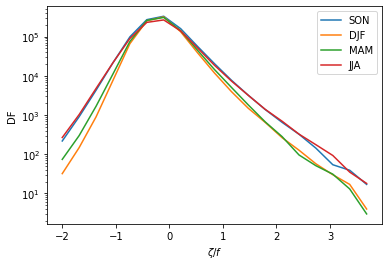

In [115]:
plt.plot(bins[0:-1], vort_hist_SON[0], label='SON')
plt.plot(bins[0:-1], vort_hist_DJF[0], label='DJF')
plt.plot(bins[0:-1], vort_hist_MAM[0], label='MAM')
plt.plot(bins[0:-1], vort_hist_JJA[0], label='JJA')
plt.yscale('log')
plt.legend()
plt.xlabel(r'$\zeta/f$')
plt.ylabel('DF')

In [116]:
strainbins = np.linspace(0, 4, 20)

In [117]:
strain_sogos_3day = strain_sogos.isel(time=slice(0,-1,24*3))

In [118]:
strain_hist_SON = np.histogram(strain_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                            time=strain_sogos_3day.groupby("time.season").groups['SON'])/(-f), bins=strainbins);

In [119]:
strain_hist_DJF = np.histogram(strain_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                            time=strain_sogos_3day.groupby("time.season").groups['DJF'])/(-f), bins=strainbins);
strain_hist_MAM = np.histogram(strain_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                            time=strain_sogos_3day.groupby("time.season").groups['MAM'])/(-f), bins=strainbins);
strain_hist_JJA = np.histogram(strain_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                            time=strain_sogos_3day.groupby("time.season").groups['JJA'])/(-f), bins=strainbins);


Text(0, 0.5, 'DF')

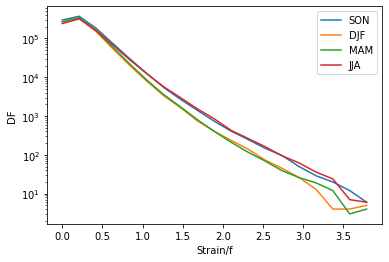

In [120]:
plt.plot(strainbins[0:-1], strain_hist_SON[0], label='SON')
plt.plot(strainbins[0:-1], strain_hist_DJF[0], label='DJF')
plt.plot(strainbins[0:-1], strain_hist_MAM[0], label='MAM')
plt.plot(strainbins[0:-1], strain_hist_JJA[0], label='JJA')
plt.yscale('log')
plt.legend()
plt.xlabel('Strain/f')
plt.ylabel('DF')

In [121]:
gradDbins = np.linspace(0, 1e-4, 20)

In [122]:
gradD_sogos_3day = gradD_sogos.isel(time=slice(0,-1,24*3))

In [123]:
gradD_hist_SON = np.histogram(gradD_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                        time=gradD_sogos_3day.groupby("time.season").groups['SON']), bins=gradDbins);

In [124]:
gradD_hist_DJF = np.histogram(gradD_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                        time=gradD_sogos_3day.groupby("time.season").groups['DJF']), bins=gradDbins);
gradD_hist_MAM = np.histogram(gradD_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                        time=gradD_sogos_3day.groupby("time.season").groups['MAM']), bins=gradDbins);
gradD_hist_JJA = np.histogram(gradD_sogos_3day.isel(i=slice(0,-1,5), j=slice(0,-1,5), 
                        time=gradD_sogos_3day.groupby("time.season").groups['JJA']), bins=gradDbins);

Text(0, 0.5, 'DF')

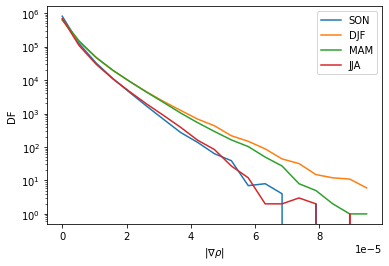

In [125]:
plt.plot(gradDbins[0:-1], gradD_hist_SON[0], label='SON')
plt.plot(gradDbins[0:-1], gradD_hist_DJF[0], label='DJF')
plt.plot(gradDbins[0:-1], gradD_hist_MAM[0], label='MAM')
plt.plot(gradDbins[0:-1], gradD_hist_JJA[0], label='JJA')
plt.yscale('log')
plt.legend()
plt.xlabel(r'$|\nabla \rho|$')
plt.ylabel('DF')

## Seasonal Maps

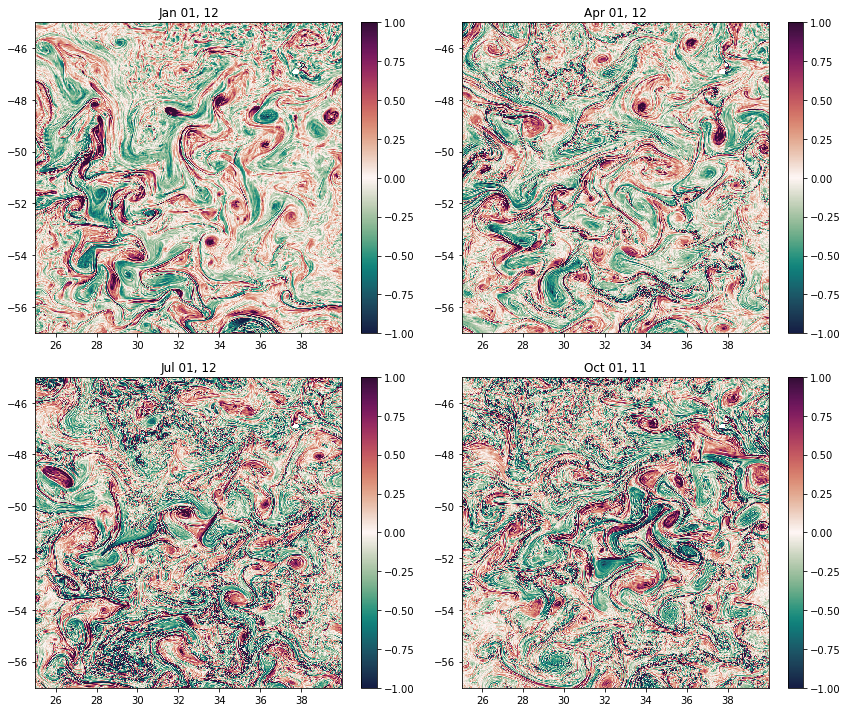

In [126]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2012-01-01T00:00:00')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-01-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(222)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2012-04-01T00:00:00')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-04-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(223)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2012-07-01T00:00:00')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-07-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(224)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2011-10-01T00:00:00')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2011-10-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.tight_layout()

In [151]:
zeta_sogos.sel(time='2012-01-01')

<xarray.DataArray (time: 24, j_g: 974, i_g: 719)>
dask.array<getitem, shape=(24, 974, 719), dtype=float32, chunksize=(1, 974, 719), chunktype=numpy.ndarray>
Coordinates: (12/15)
  * i_g      (i_g) int64 3025 3026 3027 3028 3029 ... 3739 3740 3741 3742 3743
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 ... 966 967 968 969 970 971 972 973
  * time     (time) datetime64[ns] 2012-01-01 ... 2012-01-01T23:00:00
    PHrefC   float32 15.4
    XG       (j_g, i_g) float32 dask.array<chunksize=(974, 719), meta=np.ndarray>
    YG       (j_g, i_g) float32 dask.array<chunksize=(974, 719), meta=np.ndarray>
    ...       ...
    drF      float32 1.14
    face     int64 1
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rAz      (j_g, i_g) float32 dask.array<chunksize=(974, 719), meta=np.ndarray>

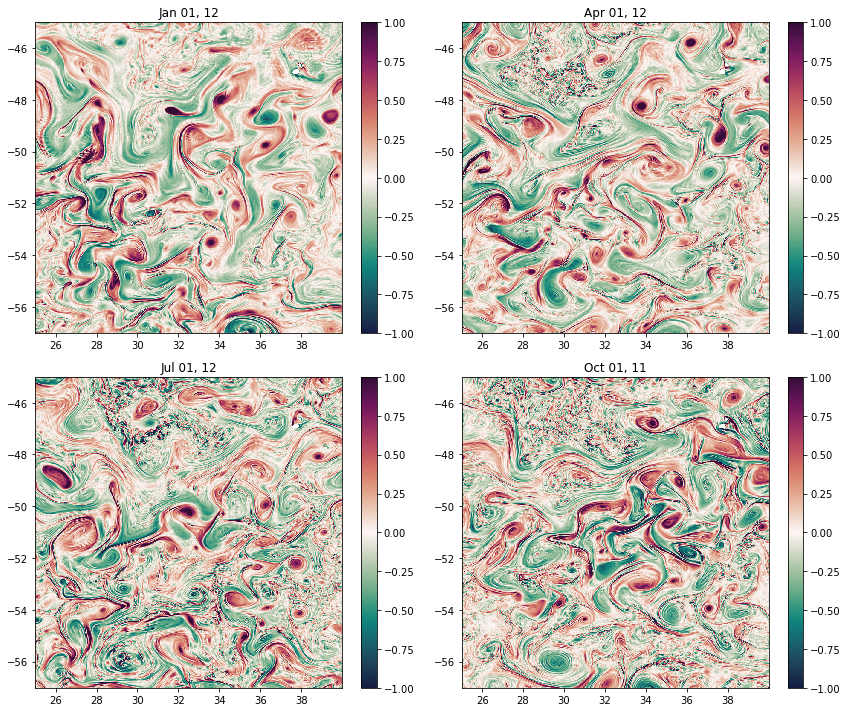

In [127]:
# Mean of One day
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2012-01-01').mean('time')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-01-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(222)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2012-04-01').mean('time')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-04-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(223)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2012-07-01T').mean('time')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-07-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(224)
plt.pcolormesh(XG, YG, 
               zeta_sogos.sel(time='2011-10-01T').mean('time')/f, vmin=-1, vmax=1, cmap=cm.curl)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2011-10-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.tight_layout()

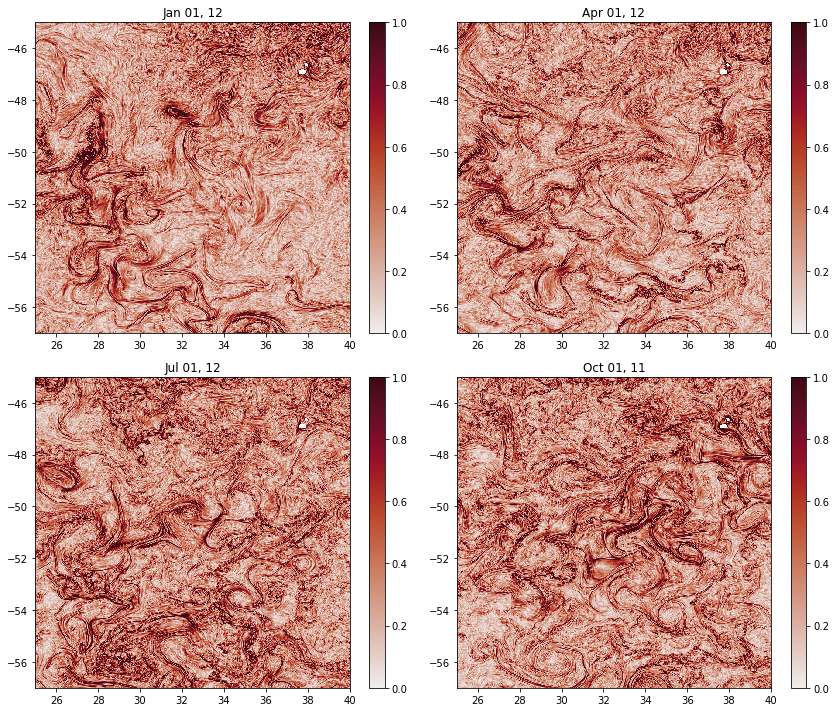

In [128]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2012-01-01T00:00:00')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-01-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(222)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2012-04-01T00:00:00')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-04-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(223)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2012-07-01T00:00:00')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-07-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(224)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2011-10-01T00:00:00')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2011-10-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.tight_layout()

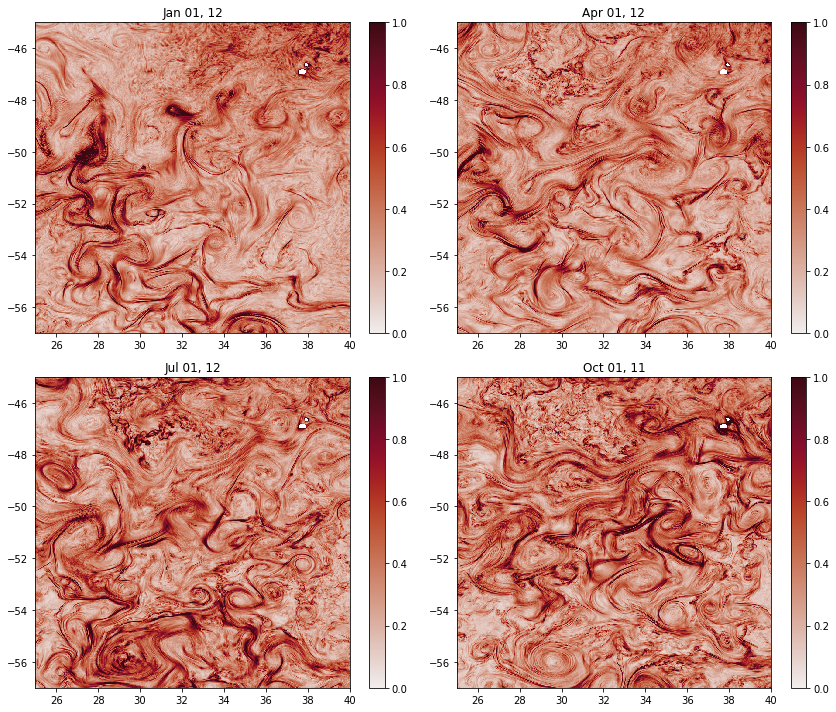

In [129]:
# Mean of One day
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2012-01-01').mean('time')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-01-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(222)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2012-04-01').mean('time')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-04-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(223)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2012-07-01').mean('time')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-07-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(224)
plt.pcolormesh(XC, YC, 
               strain_sogos.sel(time='2011-10-01').mean('time')/-f, vmin=0, vmax=1, cmap=cm.amp)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2011-10-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.tight_layout()

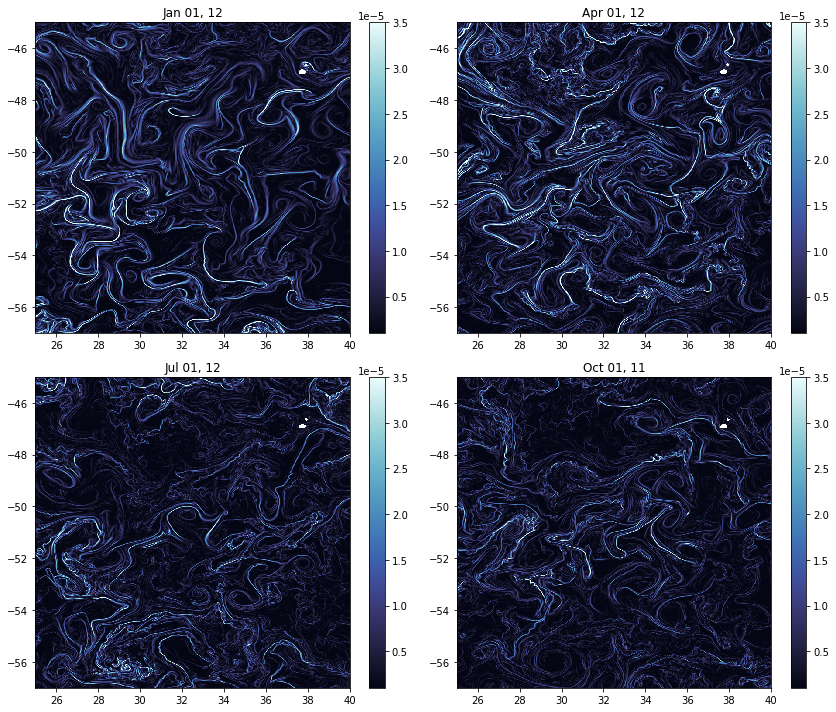

In [130]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2012-01-01T00:00:00'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-01-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(222)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2012-04-01T00:00:00'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-04-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(223)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2012-07-01T00:00:00'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-07-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(224)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2011-10-01T00:00:00'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2011-10-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.tight_layout()

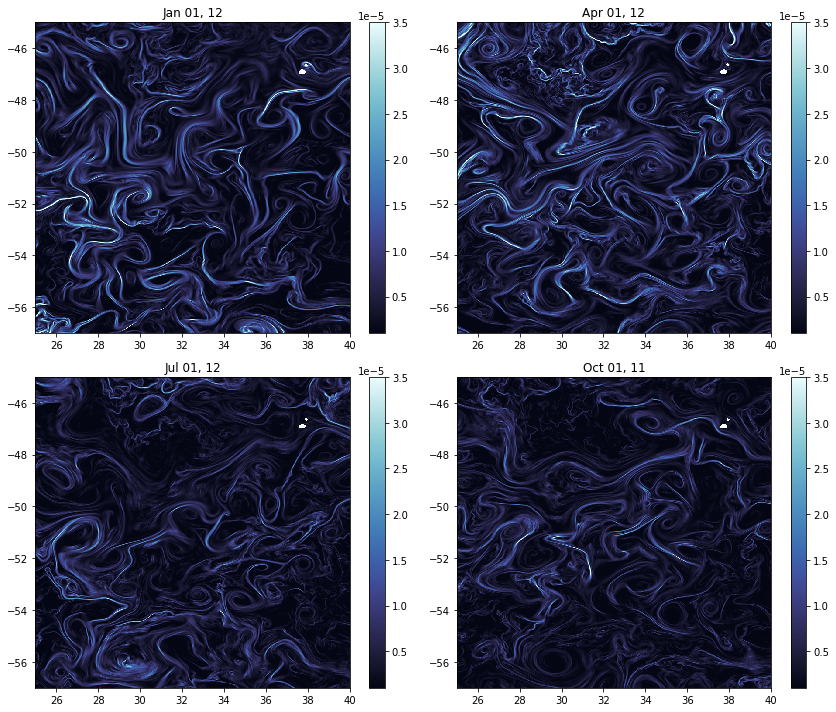

In [152]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2012-01-01').mean('time'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-01-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(222)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2012-04-01').mean('time'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-04-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(223)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2012-07-01').mean('time'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2012-07-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.subplot(224)
plt.pcolormesh(XC, YC, 
               gradD_sogos.sel(time='2011-10-01').mean('time'), vmin=0.1e-5, vmax=3.5e-5, cmap=cm.ice)
plt.colorbar()
plt.title(zeta_sogos.time.sel(time='2011-10-01T00:00:00').dt.strftime("%b %d, %y").values)

plt.tight_layout()

## Horizontal Spectra

In [131]:
# density
SSD_sogos=SSD_sogos.drop(['CS', 'Depth', 'SN', 'XC', 'YC', 'hFacC', 'rA'])
SSD_k_ps = xrft.power_spectrum(SSD_sogos,
                               dim=['i'],
                               window=True, 
                               detrend='constant').rename('SSD_psd')

/srv/conda/envs/notebook/lib/python3.9/site-packages/xrft/xrft.py:49: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


In [132]:
# spice
Spice_sogos=Spice_sogos.drop(['CS', 'Depth', 'SN', 'XC', 'YC', 'hFacC', 'rA'])
Spice_k_ps = xrft.power_spectrum(Spice_sogos,
                               dim=['i'],
                               # drop=True,
                               window=True, 
                               detrend='constant').rename('Spice_psd')

/srv/conda/envs/notebook/lib/python3.9/site-packages/xrft/xrft.py:49: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


In [133]:
# velocity
U_sogos=U_sogos.drop(['CS', 'Depth', 'SN', 'XC', 'YC', 'hFacC', 'rA'])
V_sogos=V_sogos.drop(['CS', 'Depth', 'SN', 'XC', 'YC', 'hFacC', 'rA'])

U_k_ps = xrft.power_spectrum(U_sogos,
                               dim=['i'],
                               window=True, 
                               detrend='constant').rename('U_psd')
V_k_ps = xrft.power_spectrum(V_sogos,
                               dim=['i'],
                               window=True, 
                               detrend='constant').rename('V_psd')


/srv/conda/envs/notebook/lib/python3.9/site-packages/xrft/xrft.py:49: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/srv/conda/envs/notebook/lib/python3.9/site-packages/xrft/xrft.py:49: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


In [134]:
EKE_k_ps = (0.5*(U_k_ps + V_k_ps)).rename('EKE_psd')

In [135]:
SSD_k_ps_3day = SSD_k_ps.isel(time=slice(0,-1,24*5))

SSD_k_SON = SSD_k_ps_3day.isel(j=slice(0,-1,10),
                               time=SSD_k_ps_3day.groupby("time.season").groups['SON']).mean(['j','time'])
SSD_k_DJF = SSD_k_ps_3day.isel(j=slice(0,-1,10),
                               time=SSD_k_ps_3day.groupby("time.season").groups['DJF']).mean(['j','time'])
SSD_k_MAM = SSD_k_ps_3day.isel(j=slice(0,-1,10),
                               time=SSD_k_ps_3day.groupby("time.season").groups['MAM']).mean(['j','time'])
SSD_k_JJA = SSD_k_ps_3day.isel(j=slice(0,-1,10),
                               time=SSD_k_ps_3day.groupby("time.season").groups['JJA']).mean(['j','time'])

In [136]:
SSD_k_SON.load();
SSD_k_DJF.load();
SSD_k_MAM.load();
SSD_k_JJA.load();

In [137]:
Spice_k_ps_3day = Spice_k_ps.isel(time=slice(0,-1,24*5))

Spice_k_SON = Spice_k_ps_3day.isel(j=slice(0,-1,10),
                               time=Spice_k_ps_3day.groupby("time.season").groups['SON']).mean(['j','time'])
Spice_k_DJF = Spice_k_ps_3day.isel(j=slice(0,-1,10),
                               time=Spice_k_ps_3day.groupby("time.season").groups['DJF']).mean(['j','time'])
Spice_k_MAM = Spice_k_ps_3day.isel(j=slice(0,-1,10),
                               time=Spice_k_ps_3day.groupby("time.season").groups['MAM']).mean(['j','time'])
Spice_k_JJA = Spice_k_ps_3day.isel(j=slice(0,-1,10),
                               time=Spice_k_ps_3day.groupby("time.season").groups['JJA']).mean(['j','time'])

In [138]:
Spice_k_SON.load();
Spice_k_DJF.load();
Spice_k_MAM.load();
Spice_k_JJA.load();

In [139]:
EKE_k_ps_3day = EKE_k_ps.isel(time=slice(0,-1,24*5))

EKE_k_SON = EKE_k_ps_3day.isel(j=slice(0,-1,10),
                               time=EKE_k_ps_3day.groupby("time.season").groups['SON']).mean(['j','time'])
EKE_k_DJF = EKE_k_ps_3day.isel(j=slice(0,-1,10),
                               time=EKE_k_ps_3day.groupby("time.season").groups['DJF']).mean(['j','time'])
EKE_k_MAM = EKE_k_ps_3day.isel(j=slice(0,-1,10),
                                time=EKE_k_ps_3day.groupby("time.season").groups['MAM']).mean(['j','time'])
EKE_k_JJA = EKE_k_ps_3day.isel(j=slice(0,-1,10),
                               time=EKE_k_ps_3day.groupby("time.season").groups['JJA']).mean(['j','time'])

In [140]:
EKE_k_SON.load();
EKE_k_DJF.load();
EKE_k_MAM.load();
EKE_k_JJA.load();

In [141]:
dx = (110*(XC.isel(i=1) - XC.isel(i=0))*np.cos(YC.isel(i=0)*np.pi/180))
dx_mean = dx.mean('j')

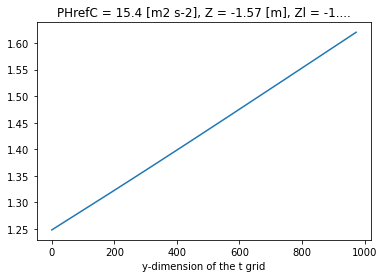

In [142]:
dx.plot() # dx changes a little bit through the domain.

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in reciprocal
  return func(*(_execute_task(a, cache) for a in args))
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in power
  return func(*(_execute_task(a, cache) for a in args))
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in power
  return func(*(_execute_task(a, cache) for a in args))


Text(0.5, 1.0, 'Density')

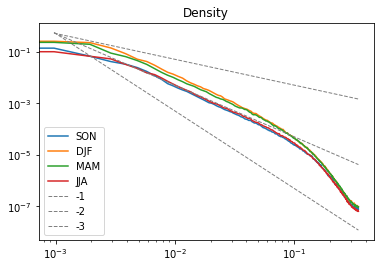

In [144]:
k = SSD_k_SON.freq_i/dx_mean

plt.plot(k, SSD_k_SON, label='SON')
plt.plot(k, SSD_k_DJF, label='DJF')
plt.plot(k, SSD_k_MAM, label='MAM')
plt.plot(k, SSD_k_JJA, label='JJA')

plt.plot(k, 5e-4*k**-1, '--',linewidth=1,color='gray', label='-1')
plt.plot(k, 5e-7*k**-2, '--',linewidth=1,color='gray', label='-2')
plt.plot(k, 5e-10*k**-3, '--',linewidth=1,color='gray', label='-3')

plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.title('Density')

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in power
  return func(*(_execute_task(a, cache) for a in args))
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in power
  return func(*(_execute_task(a, cache) for a in args))


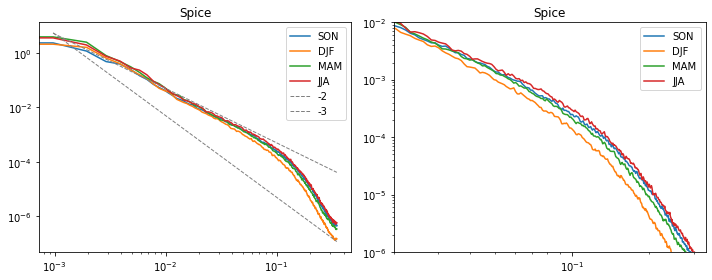

In [145]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.plot(k, Spice_k_SON, label='SON')
plt.plot(k, Spice_k_DJF, label='DJF')
plt.plot(k, Spice_k_MAM, label='MAM')
plt.plot(k, Spice_k_JJA, label='JJA')

plt.plot(k, 5e-6*k**-2, '--',linewidth=1,color='gray', label='-2')
plt.plot(k, 5e-9*k**-3, '--',linewidth=1,color='gray', label='-3')

plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.title('Spice')

plt.subplot(122)
plt.plot(k, Spice_k_SON, label='SON')
plt.plot(k, Spice_k_DJF, label='DJF')
plt.plot(k, Spice_k_MAM, label='MAM')
plt.plot(k, Spice_k_JJA, label='JJA')

plt.xlim([1/50, 1/3])
plt.ylim([1e-6, 1e-2])

plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.title('Spice')
plt.tight_layout()

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in power
  return func(*(_execute_task(a, cache) for a in args))
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in power
  return func(*(_execute_task(a, cache) for a in args))


Text(0.5, 1.0, 'EKE')

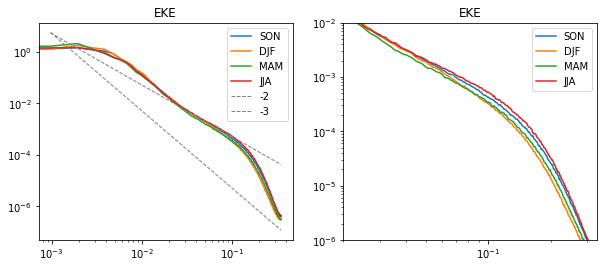

In [146]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.plot(k, EKE_k_SON, label='SON')
plt.plot(k, EKE_k_DJF, label='DJF')
plt.plot(k, EKE_k_MAM, label='MAM')
plt.plot(k, EKE_k_JJA, label='JJA')

plt.plot(k, 5e-6*k**-2, '--',linewidth=1,color='gray', label='-2')
plt.plot(k, 5e-9*k**-3, '--',linewidth=1,color='gray', label='-3')

plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.title('EKE')

plt.subplot(122)
plt.plot(k, EKE_k_SON, label='SON')
plt.plot(k, EKE_k_DJF, label='DJF')
plt.plot(k, EKE_k_MAM, label='MAM')
plt.plot(k, EKE_k_JJA, label='JJA')

plt.xlim([1/50, 1/3])
plt.ylim([1e-6, 1e-2])

plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.title('EKE')

Text(0.5, 1.0, 'Winter /Summer (JJA/DJF) Ratios')

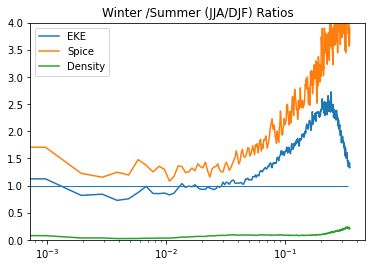

In [147]:
plt.plot(k, EKE_k_JJA/EKE_k_DJF, label='EKE')
plt.plot(k, Spice_k_JJA/Spice_k_DJF, label='Spice')
plt.plot(k, SSD_k_JJA/EKE_k_DJF, label='Density')

plt.xscale('log')
plt.legend()
plt.hlines(1, 0, 1/3, linewidth=1.)
plt.ylim([0,4])
plt.title('Winter /Summer (JJA/DJF) Ratios')

# months chosen for strong cooling and warming periods